In [1]:
import pandas as pd
import numpy as np

In [23]:
df=pd.read_csv("melb_data.csv")
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2,3067,...,1,1,202,NaN,NaN,Yarra,-38,145,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/2/2016,2,3067,...,1,0,156,79,1900,Yarra,-38,145,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/3/2017,2,3067,...,2,0,134,150,1900,Yarra,-38,145,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/3/2017,2,3067,...,2,1,94,NaN,NaN,Yarra,-38,145,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/6/2016,2,3067,...,1,2,120,142,2014,Yarra,-38,145,Northern Metropolitan,4019


# (1) Handling Missing Values

# **1)   Identifying Columns with more than 20% missing values and Dropping them**

In [24]:
missing_person=(df.isna().sum()/len(df))*100
Dropped_columns=missing_person[missing_person>20].index
print("Following are the columns with more than 20% missing Values: ")
print(Dropped_columns)
df=df.drop(columns=Dropped_columns)
print("Congrats! Columns with missing values have been dropped. ")
df.head()

Following are the columns with more than 20% missing Values: 
Index(['BuildingArea', 'YearBuilt'], dtype='object')
Congrats! Columns with missing values have been dropped. 


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2,3067,2,1,1,202,Yarra,-38,145,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/2/2016,2,3067,2,1,0,156,Yarra,-38,145,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/3/2017,2,3067,3,2,0,134,Yarra,-38,145,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/3/2017,2,3067,3,2,1,94,Yarra,-38,145,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/6/2016,2,3067,3,1,2,120,Yarra,-38,145,Northern Metropolitan,4019


# **2)Filling values in Numeric Columns using median**

In [25]:
df.fillna(df.median(numeric_only=True),inplace=True)
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2,3067,2,1,1,202,Yarra,-38,145,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/2/2016,2,3067,2,1,0,156,Yarra,-38,145,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/3/2017,2,3067,3,2,0,134,Yarra,-38,145,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/3/2017,2,3067,3,2,1,94,Yarra,-38,145,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/6/2016,2,3067,3,1,2,120,Yarra,-38,145,Northern Metropolitan,4019


# **3) Filling Values in Categorical columns using Mode**

In [26]:
Categorical_columns=df.select_dtypes(include=['object']).columns
for column in Categorical_columns:
    frequent_values=df[column].mode()
    if not frequent_values.empty:
        df[column]=df[column].fillna(frequent_values[0])
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2,3067,2,1,1,202,Yarra,-38,145,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/2/2016,2,3067,2,1,0,156,Yarra,-38,145,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/3/2017,2,3067,3,2,0,134,Yarra,-38,145,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/3/2017,2,3067,3,2,1,94,Yarra,-38,145,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/6/2016,2,3067,3,1,2,120,Yarra,-38,145,Northern Metropolitan,4019


# (2)  ADVANCED FILTERING AND INDEXING

## **1)	Retrieve all properties located in "Richmond" with a price greater than  1,000,000.**


In [27]:
# Extracting the data of properties located in Richmond with a price greater than 1,000,000.
Richmond_Houses = df[(df["Suburb"]=="Richmond") & (df["Price"]>1000000)]
Richmond_Houses.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
5257,Richmond,81 Erin St,3,h,1260000,S,Biggin,3/9/2016,3,3121,2,1,0,203,Yarra,-38,145,Northern Metropolitan,14949
5258,Richmond,52 Lyndhurst St,3,t,1236000,S,Jellis,3/9/2016,3,3121,3,2,1,675,Yarra,-38,145,Northern Metropolitan,14949
5263,Richmond,7 Bank St,3,h,1600000,S,hockingstuart,3/12/2016,3,3121,3,2,1,115,Yarra,-38,145,Northern Metropolitan,14949
5264,Richmond,29 Bowen St,3,h,2180000,PI,Blue,3/12/2016,3,3121,3,2,2,345,Yarra,-38,145,Northern Metropolitan,14949
5266,Richmond,131 Lord St,4,h,3335000,S,Jellis,3/12/2016,3,3121,4,2,2,319,Yarra,-38,145,Northern Metropolitan,14949


#  **2)Extracting the specific columns where the land size is above 500 sq.meter**

*Note: "AS WE HAVE ALREADY DROPPED COLUMNS WITH MORE THAN 20% MISSING VALUES SO (BUILDINGAREA) COLUMN IS ALREADY DROPPED!"*


In [28]:
# Extracting the specific columns where the land size is above 500 sq.meter
if "BuildindArea" in df.columns:
    df_filtered=df.loc[df["Landsize"] > 500 , ["Price","Suburb","BuildingArea"]]
else:
    print("BuildingArea column is Not Present! ^_^ ")
    df_filtered=df.loc[df["Landsize"] >  500 , ["Price","Suburb"]]
df_filtered.head()

BuildingArea column is Not Present! ^_^ 


,Price,Suburb
20,1330000,Abbotsford
22,1090000,Abbotsford
45,720000,Airport West
46,785000,Airport West
47,725000,Airport West


# **3)	Finding the top 5 most expensive houses in the dataset using sorting**

In [40]:
df_Expensive_houses = df.sort_values(by="Price",ascending=False)
df_Expensive_houses.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Price_per_Room,Year_sold
12094,Mulgrave,35 Bevis St,3,h,9000000,PI,Hall,2017-07-29,19,3170,...,1,1,744,Monash,-38,145,South-Eastern Metropolitan,7113,3000000,2017
7692,Canterbury,49 Mangarra Rd,5,h,8000000,VB,Sotheby's,2017-05-13,9,3126,...,5,4,2079,Boroondara,-38,145,Southern Metropolitan,3265,1600000,2017
9575,Hawthorn,49 Lisson Gr,4,h,7650000,S,Abercromby's,2017-06-17,5,3122,...,2,4,1690,Boroondara,-38,145,Southern Metropolitan,11308,1912500,2017
3616,Kew,15 Barry St,6,h,6500000,S,Jellis,2016-08-13,6,3101,...,6,3,1334,Boroondara,-38,145,Southern Metropolitan,10331,1083333,2016
12557,Middle Park,136 Page St,5,h,6400000,S,Marshall,2017-09-09,3,3206,...,2,1,553,Moreland,-38,145,Southern Metropolitan,2019,1280000,2017


# (3) Data Transformation and Feachered Engineering:

# **1) Creating a new column that calculates the price per room**

In [30]:
df["Price_per_Room"] = df["Price"] / df["Rooms"].astype(int)
pd.set_option("display.float_format","{:.0f}".format)
df.head()


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Price_per_Room
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,3/12/2016,2,3067,2,1,1,202,Yarra,-38,145,Northern Metropolitan,4019,740000
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,4/2/2016,2,3067,2,1,0,156,Yarra,-38,145,Northern Metropolitan,4019,517500
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,4/3/2017,2,3067,3,2,0,134,Yarra,-38,145,Northern Metropolitan,4019,488333
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,4/3/2017,2,3067,3,2,1,94,Yarra,-38,145,Northern Metropolitan,4019,283333
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,4/6/2016,2,3067,3,1,2,120,Yarra,-38,145,Northern Metropolitan,4019,400000



# **2) Converting Date column into proper date time format**

In [31]:
df["Date"] = pd.to_datetime(df["Date"], format = "%d/%m/%Y")
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Price_per_Room
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,2016-12-03,2,3067,2,1,1,202,Yarra,-38,145,Northern Metropolitan,4019,740000
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,2016-02-04,2,3067,2,1,0,156,Yarra,-38,145,Northern Metropolitan,4019,517500
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,2017-03-04,2,3067,3,2,0,134,Yarra,-38,145,Northern Metropolitan,4019,488333
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,2017-03-04,2,3067,3,2,1,94,Yarra,-38,145,Northern Metropolitan,4019,283333
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,2016-06-04,2,3067,3,1,2,120,Yarra,-38,145,Northern Metropolitan,4019,400000


# **3)	Extracting the year of sale from the date and create a new column Year_Sold**

In [32]:
df["Year_sold"] = df["Date"].dt.year
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Price_per_Room,Year_sold
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,2016-12-03,2,3067,...,1,1,202,Yarra,-38,145,Northern Metropolitan,4019,740000,2016
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,2016-02-04,2,3067,...,1,0,156,Yarra,-38,145,Northern Metropolitan,4019,517500,2016
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,2017-03-04,2,3067,...,2,0,134,Yarra,-38,145,Northern Metropolitan,4019,488333,2017
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,2017-03-04,2,3067,...,2,1,94,Yarra,-38,145,Northern Metropolitan,4019,283333,2017
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,2016-06-04,2,3067,...,1,2,120,Yarra,-38,145,Northern Metropolitan,4019,400000,2016


#                  (4) Aggregation and Grouping

## **1) Average price of properties in each Suburb**

In [33]:
Suburb_average_price = df.groupby("Suburb")["Price"].mean()
print(Suburb_average_price)

Suburb
Abbotsford     1060366
Aberfeldie     1277455
Airport West    756657
Albanvale       537083
Albert Park    1941355
                 ...  
Wonga Park      900000
Wyndham Vale    483250
Yallambie       839688
Yarra Glen      620000
Yarraville      988616
Name: Price, Length: 314, dtype: float64


# **2) Finding the total number of properties sold in each suburb.**

In [34]:
Properties_per_Suburb = df.groupby("Suburb")["Price"].count()
print(Properties_per_Suburb)

Suburb
Abbotsford       56
Aberfeldie       44
Airport West     67
Albanvale         6
Albert Park      69
               ... 
Wonga Park        1
Wyndham Vale      4
Yallambie        24
Yarra Glen        1
Yarraville      164
Name: Price, Length: 314, dtype: int64



## **3) Identifying Suburb with the highest average price.**

In [41]:
Most_Expensive_Suburb = Suburb_average_price.idxmax()
print(f"This is the  most expensive Suburb : {Most_Expensive_Suburb} ")

This is the  most expensive Suburb : Kooyong 


# **Creating new column of Category for identifying houses as Expensive or Affordable**

In [20]:
df["Category"] = ["Expensive" if price > df["Price"].median() else "Affordable" for price in df["Price"]]
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Price_per_Room,Year_sold,Category
0,Abbotsford,85 Turner St,2,h,1480000,S,Biggin,2016-12-03,2,3067,...,1,202,Yarra,-38,145,Northern Metropolitan,4019,740000,2016,Expensive
1,Abbotsford,25 Bloomburg St,2,h,1035000,S,Biggin,2016-02-04,2,3067,...,0,156,Yarra,-38,145,Northern Metropolitan,4019,517500,2016,Expensive
2,Abbotsford,5 Charles St,3,h,1465000,SP,Biggin,2017-03-04,2,3067,...,0,134,Yarra,-38,145,Northern Metropolitan,4019,488333,2017,Expensive
3,Abbotsford,40 Federation La,3,h,850000,PI,Biggin,2017-03-04,2,3067,...,1,94,Yarra,-38,145,Northern Metropolitan,4019,283333,2017,Affordable
4,Abbotsford,55a Park St,4,h,1600000,VB,Nelson,2016-06-04,2,3067,...,2,120,Yarra,-38,145,Northern Metropolitan,4019,400000,2016,Expensive


# **Finding correlation between Rooms and their Prices**

In [45]:
print(df[["Rooms","Price"]].corr())


       Rooms  Price
Rooms      1      0
Price      0      1


In [46]:
df.to_csv("cleaned_melb_data.csv", index=False)

Text(0.5, 0, 'Suburb')

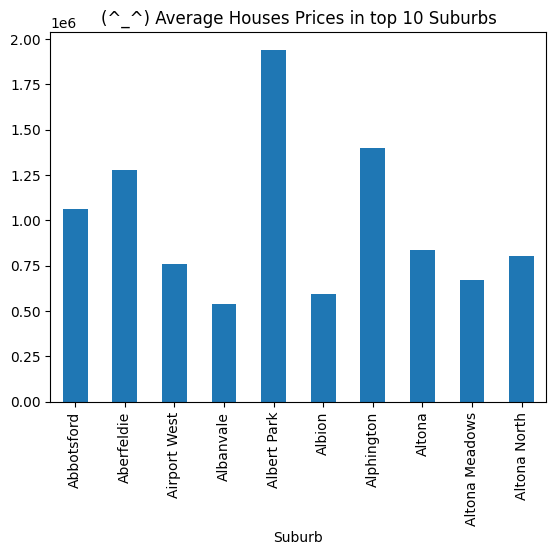

In [51]:
import matplotlib.pyplot as plt
Suburb_average_price.head(10).plot(kind="bar")
plt.title("(^_^) Average Houses Prices in top 10 Suburbs")
plt.xlabel("Suburb")

In [49]:
!pip install visions==0.7.6 --use-deprecated=legacy-resolver

!pip install --upgrade numba --use-deprecated=legacy-resolver

!pip install ydata-profiling --use-deprecated=legacy-resolver

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.3 MB/s eta 0:00:00
Requirement already up-to-date: numba in /usr/local/lib/python3.11/dist-packages (0.61.0)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 19.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 45.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 66.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=0219103ceaf22989ac56356f83acdae801877de36dccad697e78164d395fcc24
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
  Attempting uninstall: multimethod
    Found existing installation: multimethod 2.0
    Uninstalling multimethod-2.0:
      Successfully uninstalled multimethod-2.0


In [ ]:
#from google.colab import drive
drive.mount('/content/drive')
# This command is only used if you want to connect GOogle Drive

In [50]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]